In [1]:
#import
#basic necessities
import pandas as pd 
import numpy as np

#for dimension reduction
from sklearn.preprocessing import StandardScaler, MultiLabelBinarizer
from sklearn.decomposition import PCA

#for clustering
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform

#for plotting
import seaborn as sns
import matplotlib.pyplot as plt

#for dates
import datetime



#for predictive modelling 
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier

#for using seaborn, if needed
from matplotlib.style import use

#for parallel coordinates
from pandas.plotting import parallel_coordinates

#for drawing the DT Classifier structure
from sklearn.tree import export_graphviz
from graphviz import Digraph
import graphviz



In [2]:
#VAT and NMI functions (from workshop 8) :
def VAT(R):
          
    R = np.array(R)
    N, M = R.shape
    if N != M:
        R = squareform(pdist(R))
        
    J = list(range(0, N))
    
    y = np.max(R, axis=0)
    i = np.argmax(R, axis=0)
    j = np.argmax(y)
    y = np.max(y)


    I = i[j]
    del J[I]

    y = np.min(R[I,J], axis=0)
    j = np.argmin(R[I,J], axis=0)
    
    I = [I, J[j]]
    J = [e for e in J if e != J[j]]
    
    C = [1,1]
    for r in range(2, N-1):   
        y = np.min(R[I,:][:,J], axis=0)
        i = np.argmin(R[I,:][:,J], axis=0)
        j = np.argmin(y)        
        y = np.min(y)      
        I.extend([J[j]])
        J = [e for e in J if e != J[j]]
        C.extend([i[j]])
    
    y = np.min(R[I,:][:,J], axis=0)
    i = np.argmin(R[I,:][:,J], axis=0)
    
    I.extend(J)
    C.extend(i)
    
    RI = list(range(N))
    for idx, val in enumerate(I):
        RI[val] = idx

    RV = R[I,:][:,I]
    
    return RV.tolist(), C, I

def my_entropy(probs):
    return -probs.dot(np.log2(probs))
def mutual_info(X,Y):
    
    df = pd.DataFrame.from_dict({'X' : X,  'Y' :Y})
    Hx = my_entropy(df.iloc[:,0].value_counts(normalize=True, sort=False))
    Hy = my_entropy(df.iloc[:,1].value_counts(normalize=True, sort=False))
    
    
    counts = df.groupby(["X","Y"]).size()
    probs = counts/ counts.values.sum()
    H_xy = my_entropy(probs)

    # Mutual Information
    I_xy = Hx + Hy - H_xy
    MI = I_xy
    NMI = I_xy/min(Hx,Hy)  
    return NMI

## CONSTANTS

In [3]:
#all the useful columns are: 
USEFUL = ["ACCIDENT_NO","ACCIDENTDATE","ACCIDENTTIME","ACCIDENT_TYPE","Accident Type Desc","DAY_OF_WEEK",
"Day Week Description","DCA_CODE","DCA Description","DIRECTORY_NEW","GRID_REFERENCE_X_NEW","GRID_REFERENCE_Y",
"LIGHT_CONDITION","Light Condition Desc","NO_OF_VEHICLES","NO_PERSONS", "NO_PERSONS_INJ_2", 
"NO_PERSONS_INJ_3", "NO_PERSONS_KILLED", "NO_PERSONS_NOT_INJ", "SEX","AGE","Age Group","INJ_LEVEL","Inj Level Desc",
"HELMET_BELT_WORN","ROAD_USER_TYPE","Road User Type Desc","PEDEST_MOVEMENT","EJECTED_CODE","POLICE_ATTEND",
"ROAD_GEOMETRY", "Road Geometry Desc","SEVERITY", "SPEED_ZONE","NO_PERSONS_INJ", "SEATING_POSITION" ]

#possible causal factors of a severity of each road accident
POSSIBLE_CAUSES = ['ACCIDENTTIME','ACCIDENT_TYPE', 'DAY_OF_WEEK','GRID_REFERENCE_X_NEW', 'GRID_REFERENCE_Y',
                   'LIGHT_CONDITION', 'NO_OF_VEHICLES', 'ROAD_GEOMETRY','SEATING_POS_CODE','HELMET_BELT_WORN', 
                   'ROAD_USER_TYPE',  'PEDEST_MOVEMENT', 'EJECTED_CODE', 'SPEED_ZONE']

IMPACTS = ['NO_PERSONS', 'NO_PERSONS_INJ_2', 'NO_PERSONS_INJ_3', 'NO_PERSONS_KILLED', 'NO_PERSONS_NOT_INJ', 
           'NO_PERSONS_INJ','INJ_LEVEL'] 



## Reading csv

In [4]:
raw_df =  pd.read_csv("CRASH/ACCIDENT.csv", low_memory= False)
raw_df3 = pd.read_csv("CRASH/PERSON.csv",low_memory=False)



#show how they look like 
print("visual on ACCIDENT.csv:")
display(raw_df.head(2))
display(raw_df.shape)

print("visual on PERSON.csv:")
display(raw_df3.head(2))
display(raw_df3.shape)


visual on ACCIDENT.csv:


,ACCIDENT_NO,ACCIDENTDATE,ACCIDENTTIME,ACCIDENT_TYPE,Accident Type Desc,DAY_OF_WEEK,Day Week Description,DCA_CODE,DCA Description,DIRECTORY,...,NO_PERSONS,NO_PERSONS_INJ_2,NO_PERSONS_INJ_3,NO_PERSONS_KILLED,NO_PERSONS_NOT_INJ,POLICE_ATTEND,ROAD_GEOMETRY,Road Geometry Desc,SEVERITY,SPEED_ZONE
0,T20060000010,13/01/2006,12.42.00,1,Collision with vehicle,6,Friday,113,RIGHT NEAR (INTERSECTIONS ONLY),MEL,...,6,0,1,0,5,1,1,Cross intersection,3,60
1,T20060000018,13/01/2006,19.10.00,1,Collision with vehicle,6,Friday,113,RIGHT NEAR (INTERSECTIONS ONLY),MEL,...,4,0,1,0,3,1,2,T intersection,3,70


(170707, 28)

visual on PERSON.csv:


,ACCIDENT_NO,PERSON_ID,VEHICLE_ID,SEX,AGE,Age Group,INJ_LEVEL,Inj Level Desc,SEATING_POSITION,HELMET_BELT_WORN,ROAD_USER_TYPE,Road User Type Desc,LICENCE_STATE,PEDEST_MOVEMENT,POSTCODE,TAKEN_HOSPITAL,EJECTED_CODE
0,T20060000010,01,A,F,NaN,unknown,4,Not injured,LF,1,3,Passengers,,0,3130.0,,0
1,T20060000010,02,C,M,43.0,40-49,4,Not injured,LF,1,3,Passengers,,0,7310.0,,0


(412126, 17)

# 1. Preprocessing and Integration:
<p>  - make a sample of 10000 rows (random_state for this phase 3 is always 42), then clean up data for the 2 dataframes: </p>
<p> - understand dataset column types and total NaN values for each column </p>
<p> - fix up some NaN values that will be used and make a column for Seating Position to be numerical  </p>
<p> - convert several String columns into floats / ints  </p>
<p> - make sure accident dates are correct (the metadata mentioned to be between 1 January 2006 to 31st December 2014) </p>
<p> - then, make sure data in each dataframe are related to each other (according to their ACCIDENT_NO) </p>
    


In [5]:

#cut down dataset 

new_df = raw_df.sample(n=10000, replace = False, random_state = 42)


#drop duplicates

new_df.drop_duplicates(subset = "ACCIDENT_NO", inplace = True)


display(new_df.shape)


    

(10000, 28)

In [6]:
#check null values for each column.
print("NULL values in each columns for new_df: ")
for i in new_df.columns:
    print("{} : {}".format(i,new_df[i].isnull().sum()) )



NULL values in each columns for new_df: 
ACCIDENT_NO : 0
ACCIDENTDATE : 0
ACCIDENTTIME : 0
ACCIDENT_TYPE : 0
Accident Type Desc : 0
DAY_OF_WEEK : 0
Day Week Description : 0
DCA_CODE : 0
DCA Description : 0
DIRECTORY : 42
EDITION : 42
PAGE : 42
GRID_REFERENCE_X : 42
GRID_REFERENCE_Y : 42
LIGHT_CONDITION : 0
Light Condition Desc : 0
NODE_ID : 0
NO_OF_VEHICLES : 0
NO_PERSONS : 0
NO_PERSONS_INJ_2 : 0
NO_PERSONS_INJ_3 : 0
NO_PERSONS_KILLED : 0
NO_PERSONS_NOT_INJ : 0
POLICE_ATTEND : 0
ROAD_GEOMETRY : 0
Road Geometry Desc : 0
SEVERITY : 0
SPEED_ZONE : 0


In [7]:
#make new column to count all persons injured (including killed) into 1 column called "NO_PERSONS_INJ"
new_df["NO_PERSONS_INJ"] = new_df["NO_PERSONS_INJ_2"] + new_df["NO_PERSONS_INJ_3"] + new_df["NO_PERSONS_KILLED"]
X = [o for o in IMPACTS if (o != "INJ_LEVEL")]
display(new_df.loc[:,X].head(2))




,NO_PERSONS,NO_PERSONS_INJ_2,NO_PERSONS_INJ_3,NO_PERSONS_KILLED,NO_PERSONS_NOT_INJ,NO_PERSONS_INJ
86956,2,1,0,0,1,1
141723,1,1,0,0,0,1


##  Preprocessing new_df (from ACCIDENT.csv)
<p>data conversion from string into coded numbers for new_df for NMI calculations. 
</p>


In [8]:



#convert GRID_REFERENCE_Y from string into float


new_df["GRID_REFERENCE_Y"] = pd.to_numeric(new_df["GRID_REFERENCE_Y"], errors = "coerce")

#let -1 replace NaNs, since all grids are positive.
new_df["GRID_REFERENCE_Y"] = new_df["GRID_REFERENCE_Y"].replace({np.nan : -1})


#assume that " " and nan are both not-known values. they are mapped into number 21 for GRID_REFERENCE_X_NEW,
#and mapped into number 2 in DIRECTORY_NEW.
new_df["GRID_REFERENCE_X_NEW"] =  new_df["GRID_REFERENCE_X"].replace({'B':0, 'D':1, 'F':2, 'N':3, 'H':4, 'C':5, 
                                                                      'U':6, 'E':7, 'A':8, 'J':9, 'G':10, 'V':11, 
                                                                      'K': 12, 'Q':13, 'P':14, 'R':15, 'L' : 16, 
                                                                      'S' :17, 'T':18, 'O':19, 'M':20, ' ' : 21, np.nan : 21}) 
new_df["DIRECTORY_NEW"] =  new_df["DIRECTORY"].replace({"MEL" : 0, "VCS" : 1, " " :2, np.nan : 2})

#Sunday is both 0 and 1, so make them become 1. 
new_df["DAY_OF_WEEK"] = new_df["DAY_OF_WEEK"].replace({0:1}) 

#sanity check, uncomment to view 
"""
print(new_df["DIRECTORY_NEW"].unique())
print(new_df["GRID_REFERENCE_X_NEW"].unique())
print(new_df["GRID_REFERENCE_Y"].unique())
print(sorted(new_df["DAY_OF_WEEK"].unique()))
"""


'\nprint(new_df["DIRECTORY_NEW"].unique())\nprint(new_df["GRID_REFERENCE_X_NEW"].unique())\nprint(new_df["GRID_REFERENCE_Y"].unique())\nprint(sorted(new_df["DAY_OF_WEEK"].unique()))\n'

In [9]:
#filter for valid dates only (1st January 2006 to 31st December 2014)
#code adapted from Phase 1 model answer. 
tmp_df = new_df.copy()

# create new column temp_acc_date and store the recognized datetime formats
tmp_df['temp_acc_date'] = pd.to_datetime(tmp_df['ACCIDENTDATE'], infer_datetime_format=True)

# get not-recognized rows
not_recogized = tmp_df[tmp_df.temp_acc_date.isna()]

# delete ACCIDENTDATE column
del tmp_df['ACCIDENTDATE']

# inplace rename temp_acc_date to ACCIDENTDATE
tmp_df.rename(columns={"temp_acc_date": "ACCIDENTDATE"}, inplace=True)

#filter for valid dates only
cond1 = tmp_df['ACCIDENTDATE'].dt.date >= datetime.date(2006, 1, 1)
cond2 = tmp_df['ACCIDENTDATE'].dt.date <= datetime.date(2014, 12, 31)

filtered_df= tmp_df[(cond1 & cond2)]



print("***")
print("number of rows with non-recognized date format: ",not_recogized.shape[0])
sorted_year = sorted(filtered_df.ACCIDENTDATE.dt.year.unique())
print("Recorded accident years: ", sorted_year)
print("year : # of records ")
for i in  sorted_year: 
    print("{} : {}".format(i,filtered_df.loc[(filtered_df.ACCIDENTDATE.dt.year == i)].shape[0]))
print("The number of acccidents with accident date between Jan-2006 and Dec-2014: {}".format(filtered_df.shape[0]))
print("***")


***
number of rows with non-recognized date format:  0
Recorded accident years:  [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014]
year : # of records 
2006 : 770
2007 : 756
2008 : 827
2009 : 835
2010 : 786
2011 : 823
2012 : 773
2013 : 780
2014 : 889
The number of acccidents with accident date between Jan-2006 and Dec-2014: 7239
***



## Integration

In [10]:
#update new_df with valid dates only. 

new_df = filtered_df.copy()


#find related data to PERSON.csv, reset index into ACCIDENT_NO
#merge all columns from 2 .csv files into 1 dataframe, and take all the columns that are of interests to be analysed. 
new_df2 = new_df.merge(raw_df3, left_on="ACCIDENT_NO", right_on = "ACCIDENT_NO", how='left')
new_df2 = new_df2.loc[:,USEFUL]
new_df2.set_index("ACCIDENT_NO", inplace = True)
new_df.set_index("ACCIDENT_NO", inplace = True)



display(new_df2.dtypes)

display(new_df2.shape)




ACCIDENTDATE            datetime64[ns]
ACCIDENTTIME                    object
ACCIDENT_TYPE                    int64
Accident Type Desc              object
DAY_OF_WEEK                      int64
Day Week Description            object
DCA_CODE                         int64
DCA Description                 object
DIRECTORY_NEW                    int64
GRID_REFERENCE_X_NEW             int64
GRID_REFERENCE_Y               float64
LIGHT_CONDITION                  int64
Light Condition Desc            object
NO_OF_VEHICLES                   int64
NO_PERSONS                       int64
NO_PERSONS_INJ_2                 int64
NO_PERSONS_INJ_3                 int64
NO_PERSONS_KILLED                int64
NO_PERSONS_NOT_INJ               int64
SEX                             object
AGE                            float64
Age Group                       object
INJ_LEVEL                        int64
Inj Level Desc                  object
HELMET_BELT_WORN                 int64
ROAD_USER_TYPE           

(17618, 36)

In [11]:
print("NULL values in each columns for new_df2: ")
for i in new_df2.columns:
    print("{} : {}".format(i,new_df2[i].isnull().sum()) )

NULL values in each columns for new_df2: 
ACCIDENTDATE : 0
ACCIDENTTIME : 0
ACCIDENT_TYPE : 0
Accident Type Desc : 0
DAY_OF_WEEK : 0
Day Week Description : 0
DCA_CODE : 0
DCA Description : 0
DIRECTORY_NEW : 0
GRID_REFERENCE_X_NEW : 0
GRID_REFERENCE_Y : 0
LIGHT_CONDITION : 0
Light Condition Desc : 0
NO_OF_VEHICLES : 0
NO_PERSONS : 0
NO_PERSONS_INJ_2 : 0
NO_PERSONS_INJ_3 : 0
NO_PERSONS_KILLED : 0
NO_PERSONS_NOT_INJ : 0
SEX : 0
AGE : 763
Age Group : 0
INJ_LEVEL : 0
Inj Level Desc : 0
HELMET_BELT_WORN : 0
ROAD_USER_TYPE : 0
Road User Type Desc : 0
PEDEST_MOVEMENT : 0
EJECTED_CODE : 0
POLICE_ATTEND : 0
ROAD_GEOMETRY : 0
Road Geometry Desc : 0
SEVERITY : 0
SPEED_ZONE : 0
NO_PERSONS_INJ : 0
SEATING_POSITION : 792


In [12]:
#clean new_df2
#conversion into numerics.
new_df2["EJECTED_CODE"] = pd.to_numeric(new_df2["EJECTED_CODE"], errors = "coerce")
#make all unknowns and NANs as 0
new_df2["EJECTED_CODE"] = new_df2["EJECTED_CODE"].replace([9,np.nan], 0) 

new_df2["ROAD_USER_TYPE"] = pd.to_numeric(new_df2["ROAD_USER_TYPE"], errors = "coerce")
new_df2["PEDEST_MOVEMENT"] =  pd.to_numeric(new_df2["PEDEST_MOVEMENT"], errors = "coerce")



#assumes NaN in SEATING_POSITION are not known.
new_df2["SEATING_POSITION"] = new_df2["SEATING_POSITION"].replace({np.nan : "NK", 'D ': "D"})

#makes coded number references to SEATING_POSITION
new_df2["SEATING_POS_CODE"] = new_df2["SEATING_POSITION"].replace({"CF":1, "CR":2, "D":3, "LF":4, "LR":5, 
               "NA":6, "NK":7, "OR":8, "PL":9, "PS":10, "RR":11})

new_df2["SEATING_POS_CODE"] =  pd.to_numeric(new_df2["SEATING_POS_CODE"], errors = "coerce")
new_df2["ACCIDENTTIME"] = pd.to_datetime(new_df2.ACCIDENTTIME,format= '%H.%M.%S').dt.hour



In [41]:
#make Total_accident for each severity level

TOTAL_ACCIDENT = []
sorted_severity = sorted(new_df["SEVERITY"].unique())

print("Recorded severity levels from this sample: ", sorted_severity)



for i in  sorted_severity: 
    #for each severity, records its total no. of accidents
    TOTAL_ACCIDENT.append(new_df.loc[(new_df.SEVERITY == i)].shape[0])

Recorded severity levels from this sample:  [1, 2, 3]


# 2. Visualisations 


In [14]:
"""makes a bar plot according to each Severity (x-axis)"""
#relabel for convenience
SEVERITY_MAP = {1 :"Fatal accident", 2 :"Serious injury accident", 3 :"Other injury accident", 4 :"Overall"}


def bar_plot(df, dict_name,attr, df2, x_label, y_label, title, total = TOTAL_ACCIDENT):
    for i in sorted(dict_name.keys()):
        #find total counts based on the wanted attribute
        lst = []
        cond2 = (df[attr] == i)
        
        #finds its proportion for each severity
        for j in range(1,4):
            cond1 = (df["SEVERITY"] == j)
            lst.append(float(df[cond1 & cond2].shape[0]) / total[j-1])
        #overall, what's the proportion? 
        lst.append(float(df[cond2].shape[0]) / df.shape[0])
        
        #adds into df2
        df2[i] = pd.Series(lst, index = [1,2,3,4])
    #rename columns so that it's related to each category
    df2.columns = [dict_name[i] for i in sorted(dict_name.keys())]
    df2["X"] = [1,2,3,4]

    #plotting..
    ax = df2.plot(x="X", y=[dict_name[i] for i in sorted(dict_name.keys())],  kind='bar', figsize=(15, 10), legend=True, fontsize = 20)

    ax.set_xlabel(x_label, fontsize=28 )

    plt.xticks([i for i in range(4)], [SEVERITY_MAP[i] for i in SEVERITY_MAP], rotation= 0, fontsize = 13)

    ax.set_ylabel(y_label, fontsize=28)
    ax.set_title(title, size=20)
    plt.grid(color='b', linestyle='-', linewidth=0.5, axis = "y")
    plt.show()

[308, 5879, 10542]


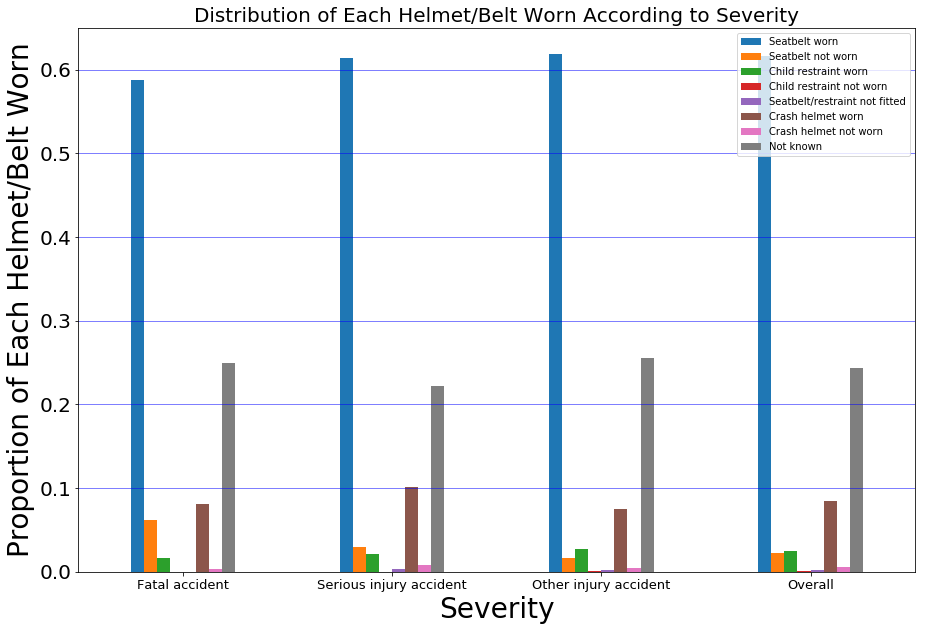

In [15]:
#for each severity, how many passenger wear seatbelts
SEATBELTS = {1:"Seatbelt worn", 2:"Seatbelt not worn", 3:"Child restraint worn", 
             4:"Child restraint not worn", 5:'Seatbelt/restraint not fitted', 
             6:"Crash helmet worn", 7:"Crash helmet not worn", 
             9:"Not known"}
#since 8 means Not appropriate, we take them out. 
cond1 = (new_df2["HELMET_BELT_WORN"] != 8) 
tmp_df = new_df2[cond1]

#count total seatbelts and helmets that should be worn
TOTAL_SEATBELTS_HELMETS = []
for i in  range(1,4): 
    TOTAL_SEATBELTS_HELMETS.append(tmp_df.loc[(tmp_df.SEVERITY == i)].shape[0])
print(TOTAL_SEATBELTS_HELMETS)

bar_df = pd.DataFrame()


bar_plot(tmp_df,SEATBELTS,"HELMET_BELT_WORN",bar_df, "Severity", "Proportion of Each Helmet/Belt Worn", 
        "Distribution of Each Helmet/Belt Worn According to Severity", TOTAL_SEATBELTS_HELMETS)


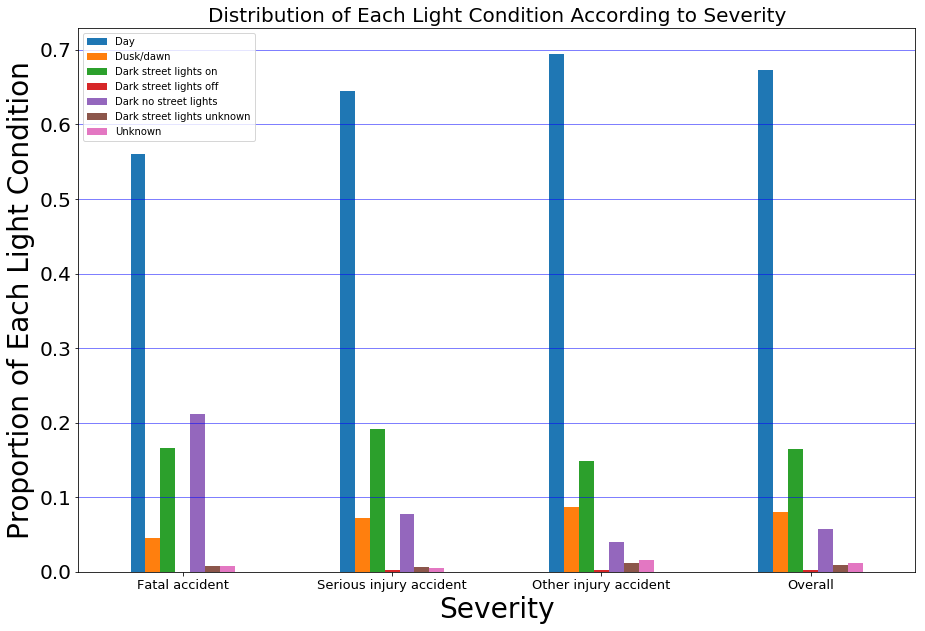

In [16]:
#overall light conditions according to each severity
bar_df = pd.DataFrame()

#make dictionary for each type of light conditions
LIGHT_MAP = {1: "Day", 2: "Dusk/dawn", 3: "Dark street lights on",  4: "Dark street lights off", 
             5: "Dark no street lights", 6: "Dark street lights unknown", 9:"Unknown"}

#bar plot them. 
bar_plot(new_df,LIGHT_MAP,"LIGHT_CONDITION",bar_df, "Severity", "Proportion of Each Light Condition", 
        "Distribution of Each Light Condition According to Severity")


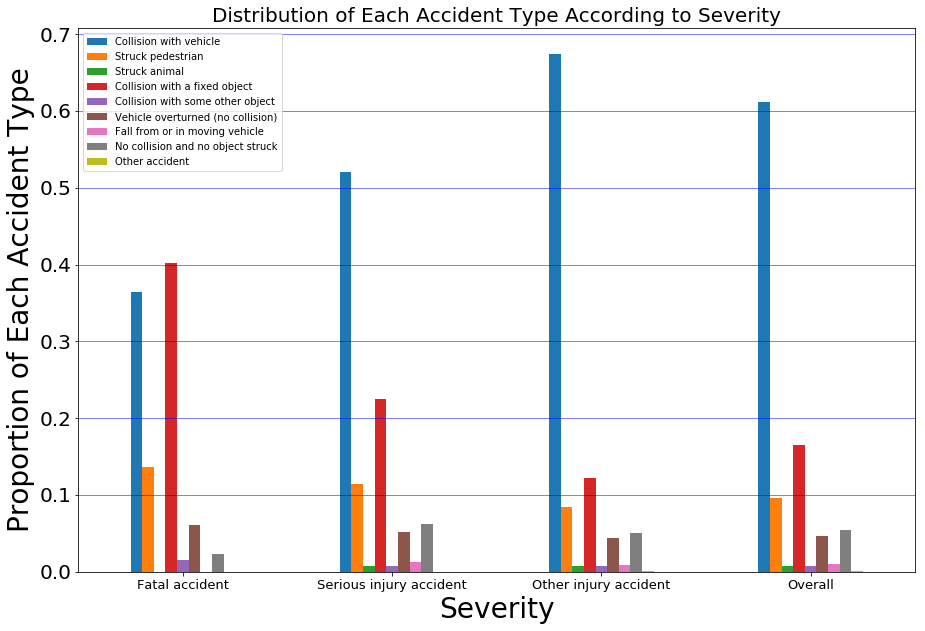

In [17]:
#overall Accident type according to each severity
ACCIDENT_TYPE_DICT = {1: "Collision with vehicle", 2: "Struck pedestrian" ,3: "Struck animal", 
                      4: "Collision with a fixed object" ,5: "Collision with some other object", 6: 
                      "Vehicle overturned (no collision)", 7: "Fall from or in moving vehicle",
                      8: "No collision and no object struck", 9: "Other accident"}
bar_df = pd.DataFrame()
bar_plot(new_df,ACCIDENT_TYPE_DICT,"ACCIDENT_TYPE",bar_df, "Severity", "Proportion of Each Accident Type", 
        "Distribution of Each Accident Type According to Severity")


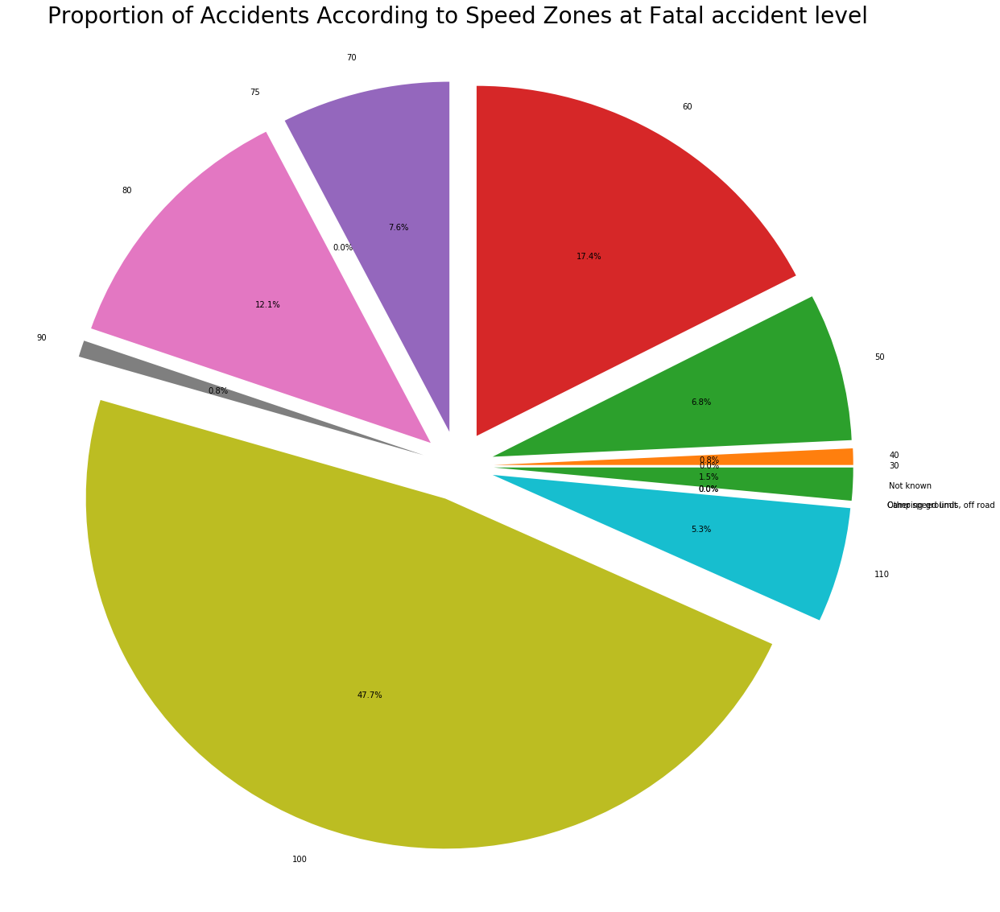

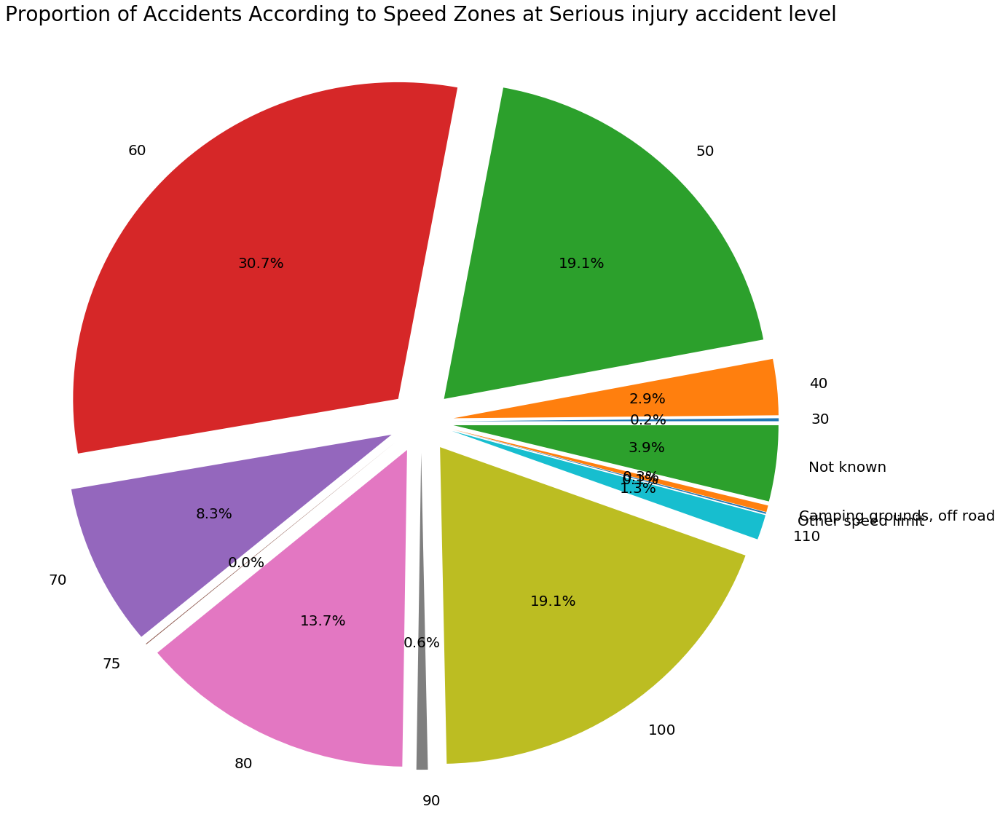

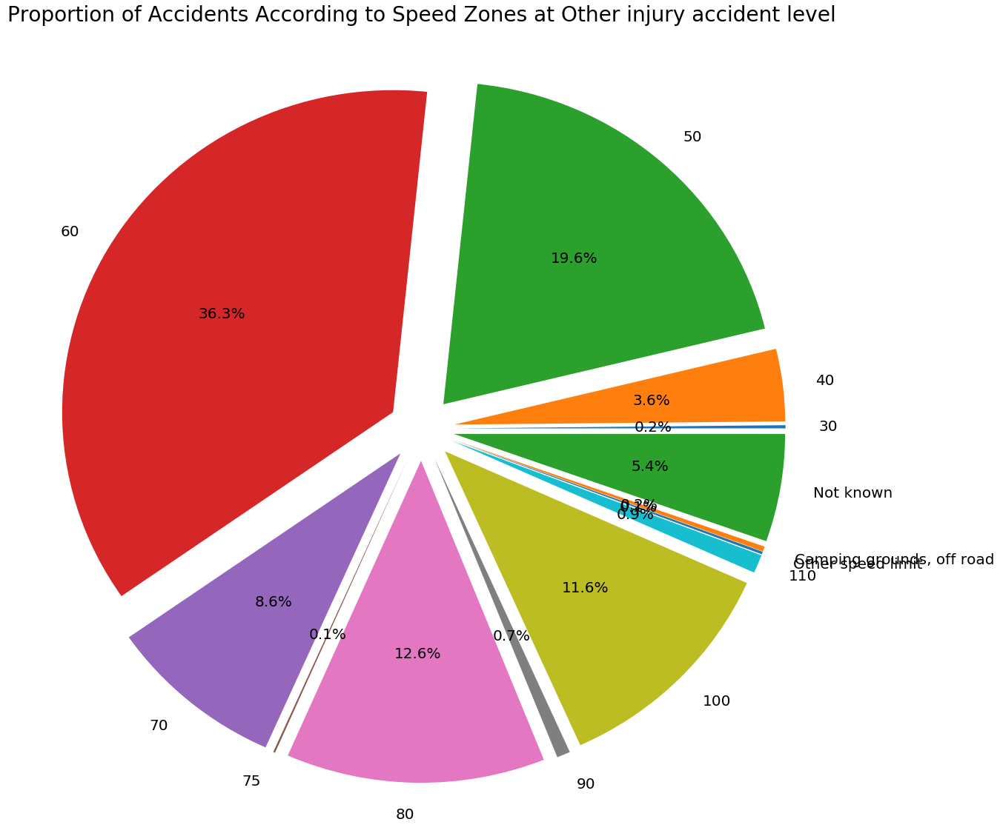

In [18]:
#which speed zone have most accident according to severity level
SPEED_ZONE_DICT = {777: "Other speed limit", 888: "Camping grounds, off road", 999: "Not known"}

LABELS = sorted(new_df.SPEED_ZONE.unique())

speed_sum = []


#make the labels...
for i in LABELS:
    if i not in SPEED_ZONE_DICT:
        SPEED_ZONE_DICT[i] = i 
        
for j in range(1,4):
    #find each severity
    cond1 = (new_df["SEVERITY"] == j)
    speed_sum = []
    
    for i in LABELS:
        #find proportion of each speed zone
        cond2 = (new_df["SPEED_ZONE"] == i)
        speed_sum.append(float(new_df[cond2&cond1].shape[0]))
    
    #set as dataframe
    speed_sum = pd.DataFrame(speed_sum)
    speed_sum.index = LABELS
    
    #PLOT..
    fig = plt.figure(figsize=(20,20))
    plt.pie( speed_sum[0], explode = [0.1 for i in range(speed_sum.shape[0])], labels = [SPEED_ZONE_DICT[i] for i in LABELS] , autopct = '%1.1f%%')
    plt.title("Proportion of Accidents According to Speed Zones at {} level".format(SEVERITY_MAP[j]), size = 28)
    plt.rcParams['font.size'] = 20.0
    
    plt.show()


## 3. Transformation, Correlation, Dendogram

In [19]:
tmp_df = new_df2.dropna()


#make X for all impacts factors and normalise it. 
X_impact = tmp_df.loc[:,IMPACTS].values
X_scaled_impact = StandardScaler().fit_transform(X_impact)

#make X for all causal factors and normalise it. 
X_causes = tmp_df.loc[:,POSSIBLE_CAUSES].values
X_scaled_causes = StandardScaler().fit_transform(X_causes)

#make X for both impacts and causal factors and normalise it.  
X = tmp_df.loc[:,POSSIBLE_CAUSES+IMPACTS].values
X_scaled = StandardScaler().fit_transform(X)


#make SEVERITY as label
Y = tmp_df.loc[:,"SEVERITY"]

#report all shapes

print("***") 
print(" X_scaled_impact matrix details")
print("Shape: {}".format(X_scaled_impact.shape))
print("Min: {0:0.4f} ".format(X_scaled_impact.min()))
print("Max: {0:0.4f}".format(X_scaled_impact.max())) 
print("Average: {0:0.4f}".format(X_scaled_impact.mean()))
print("Standard Deviation: {0:0.4f}".format(X_scaled_impact.std())) 
print("***") 
print(" X_scaled_causes matrix details")
print("Shape: {}".format(X_scaled_causes.shape))
print("Min: {0:0.4f} ".format(X_scaled_causes.min()))
print("Max: {0:0.4f}".format(X_scaled_causes.max())) 
print("Average: {0:0.4f}".format(X_scaled_causes.mean()))
print("Standard Deviation: {0:0.4f}".format(X_scaled_causes.std())) 
print("***") 




***
 X_scaled_impact matrix details
Shape: (16855, 7)
Min: -2.8810 
Max: 19.0576
Average: 0.0000
Standard Deviation: 1.0000
***
 X_scaled_causes matrix details
Shape: (16855, 14)
Min: -2.6085 
Max: 11.5732
Average: 0.0000
Standard Deviation: 1.0000
***


/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


###  PCA

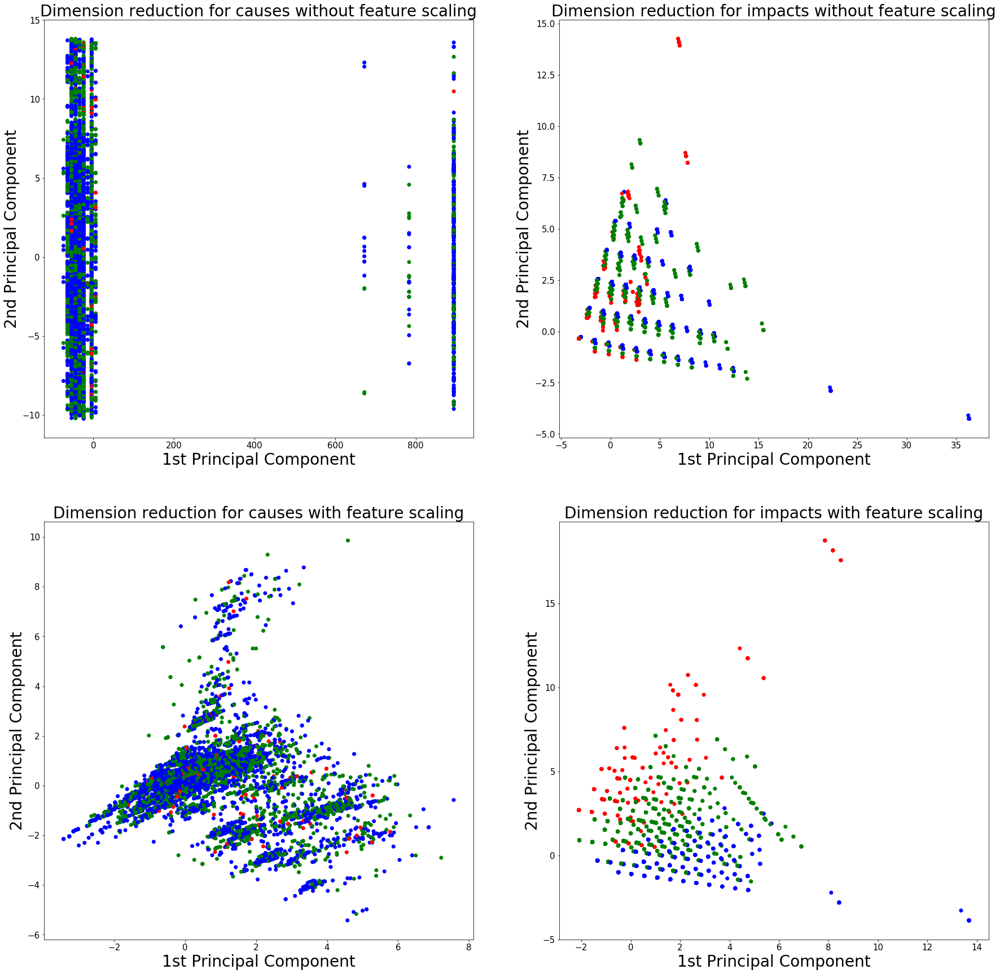

In [20]:
sklearn_pca = PCA(n_components=2)   #we want just the first two PCs
X_reduced_causes = sklearn_pca.fit_transform(X_causes)
X_standard_reduced_causes = sklearn_pca.fit_transform(X_scaled_causes)
X_reduced_impact = sklearn_pca.fit_transform(X_impact)
X_standard_reduced_impact = sklearn_pca.fit_transform(X_scaled_impact)




#make color for each severity
rgb = Y.replace([1,2,3],['r','g','b'])


plt.figure(figsize = (30,30))

#draw causes factors without scaling....
plt.subplot(2,2,1)
tmp_df = pd.DataFrame(X_reduced_causes)
plt.scatter(tmp_df.iloc[:,0],tmp_df.iloc[:,1], color = rgb)
plt.xlabel('1st Principal Component', fontsize=28)
plt.ylabel('2nd Principal Component', fontsize=28)
plt.title("Dimension reduction for causes without feature scaling",fontsize=28 )
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)


#draw impacts factors without scaling....
plt.subplot(2,2,2)
tmp_df = pd.DataFrame(X_reduced_impact)
plt.scatter(tmp_df.iloc[:,0],tmp_df.iloc[:,1],color = rgb)
plt.xlabel('1st Principal Component', fontsize=28)
plt.ylabel('2nd Principal Component', fontsize=28)
plt.title("Dimension reduction for impacts without feature scaling",fontsize=28 )
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)



#draw causes factors with scaling....
tmp_df = pd.DataFrame(X_standard_reduced_causes)
plt.subplot(2,2,3)
plt.scatter(tmp_df.iloc[:,0],tmp_df.iloc[:,1],color = rgb)
plt.xlabel('1st Principal Component', fontsize=28)
plt.ylabel('2nd Principal Component', fontsize=28)
plt.title("Dimension reduction for causes with feature scaling",fontsize=28 )
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)



#draw impacts factors with scaling....
tmp_df = pd.DataFrame(X_standard_reduced_impact)
plt.subplot(2,2,4)
plt.scatter(tmp_df.iloc[:,0],tmp_df.iloc[:,1],color = rgb)
plt.xlabel('1st Principal Component', fontsize=28)
plt.ylabel('2nd Principal Component', fontsize=28)
plt.title("Dimension reduction for impacts with feature scaling",fontsize=28 )
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)
plt.show() 







## Dendogram, Clustering  

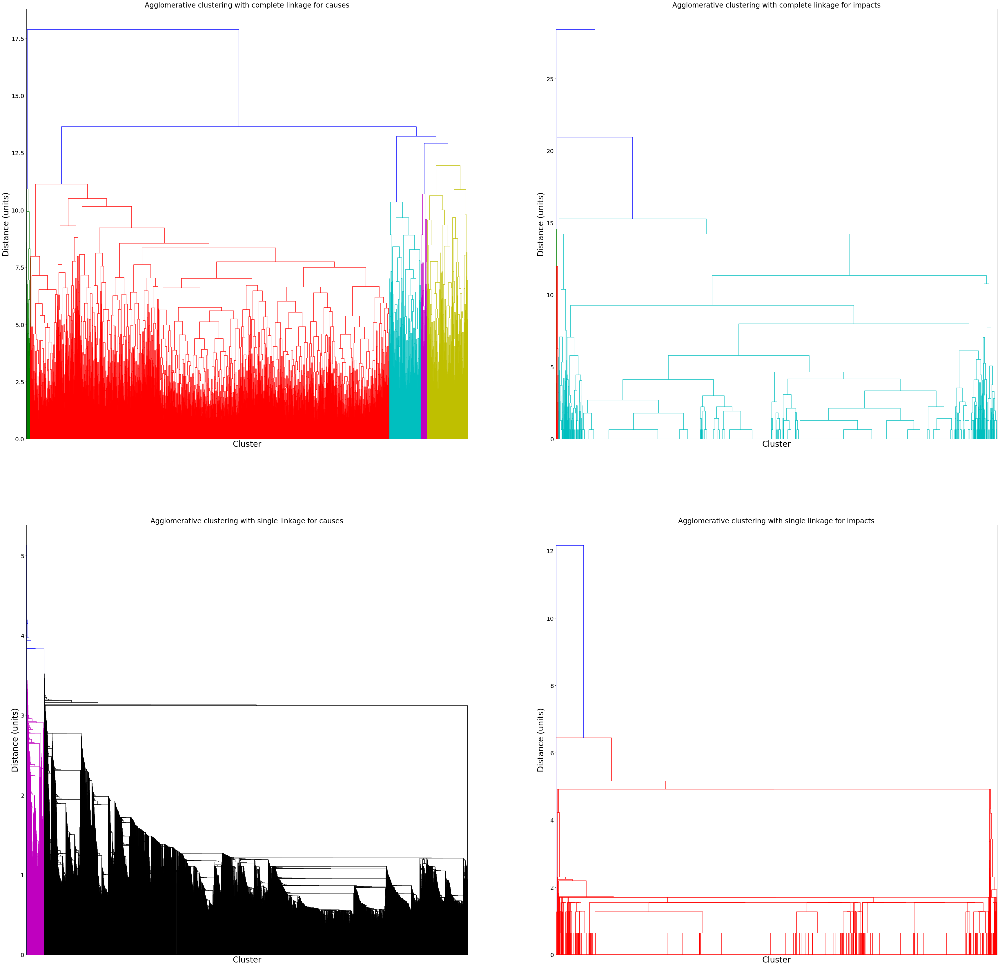

In [21]:
d = pdist(X_scaled_causes, 'euclidean')

fig = plt.figure(figsize=(60, 60))
#gives the complete dendogram for causes factors
plt.subplot(2,2,1)
complete_dendogram = linkage(d, 'complete') 
dendrogram(complete_dendogram,  no_labels = True)
plt.title("Agglomerative clustering with complete linkage for causes", fontsize = 24)
plt.xlabel('Cluster', fontsize=28)
plt.ylabel('Distance (units)', fontsize=28)


#gives the minimum dendogram for causes factors
plt.subplot(2,2,3)
single_dendogram =  linkage(d, 'single') 
dendrogram(single_dendogram,no_labels = True)
plt.title("Agglomerative clustering with single linkage for causes", fontsize = 24)
plt.xlabel('Cluster', fontsize=28)
plt.ylabel('Distance (units)', fontsize=28)

d = pdist(X_scaled_impact, 'euclidean')


#gives the complete dendogram for impacts factors
plt.subplot(2,2,2)
complete_dendogram = linkage(d, 'complete') 
dendrogram(complete_dendogram,  no_labels = True)
plt.title("Agglomerative clustering with complete linkage for impacts", fontsize = 24)
plt.xlabel('Cluster', fontsize=28)
plt.ylabel('Distance (units)', fontsize=28)


#gives the minimum dendogram for impacts factors
plt.subplot(2,2,4)
single_dendogram =  linkage(d, 'single') 
dendrogram(single_dendogram,no_labels = True)
plt.title("Agglomerative clustering with single linkage for impacts", fontsize = 24)
plt.xlabel('Cluster', fontsize=28)
plt.ylabel('Distance (units)', fontsize=28)
plt.show()



## Correlation Matrix Heat Map

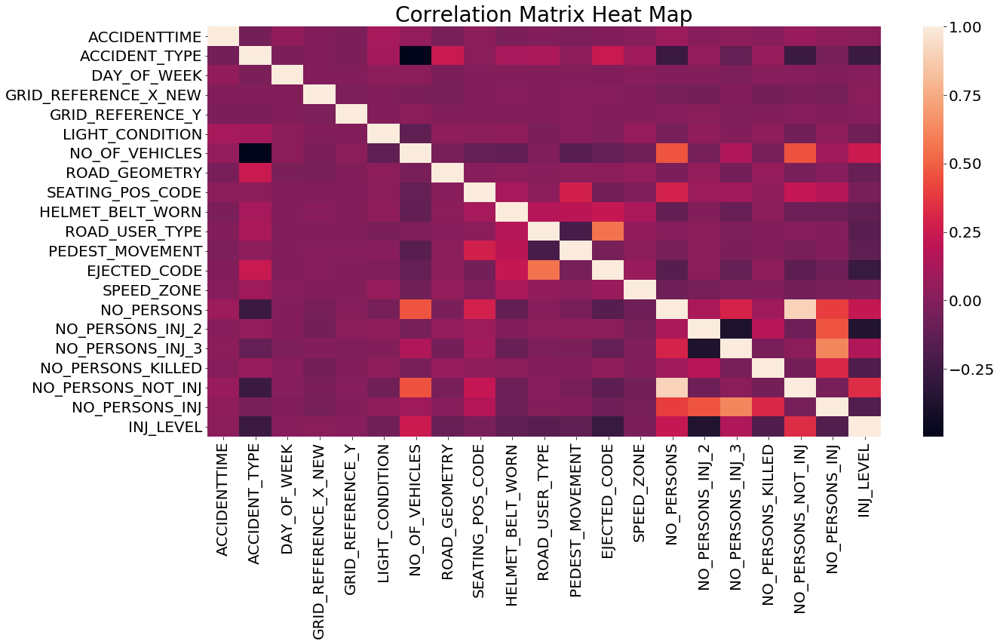

In [22]:
tmp_df = pd.DataFrame(X_scaled)

fig, ax = plt.subplots(figsize=(20,10))   
plt.title( "Correlation Matrix Heat Map", size = 28)
sns.heatmap(tmp_df.corr(), axes = ax, xticklabels = (POSSIBLE_CAUSES+IMPACTS), yticklabels = (POSSIBLE_CAUSES+IMPACTS))

plt.show()

## NMI against Label (Severity) 

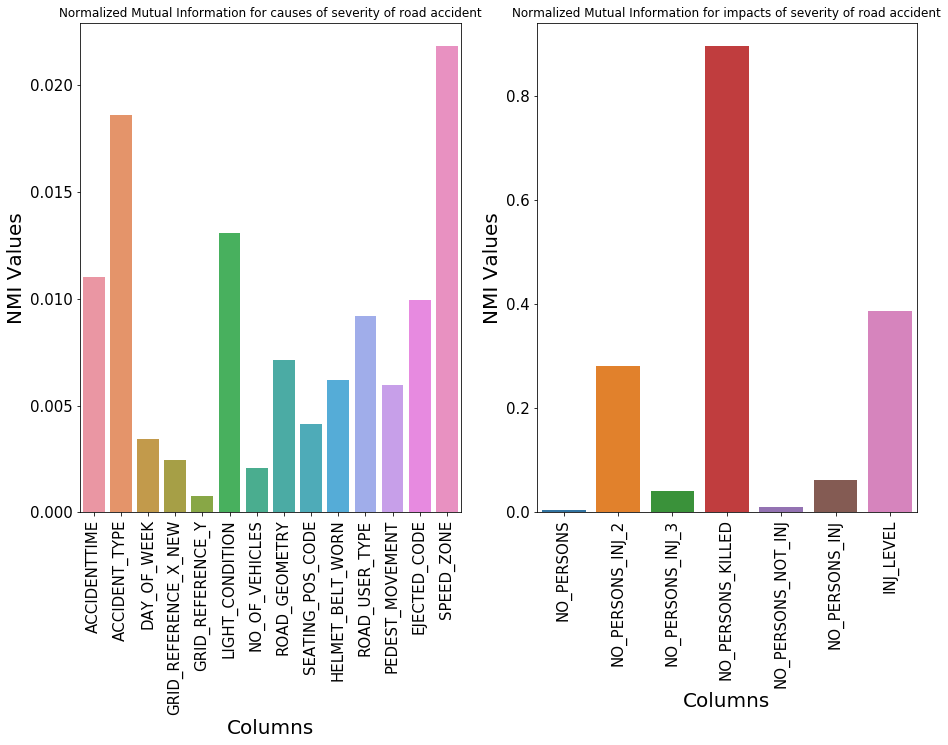

In [23]:
CONTINUOUS_NUMERICAL = [ "GRID_REFERENCE_Y", "NO_OF_VEHICLES", 
                        "NO_PERSONS","NO_PERSONS_INJ_2","NO_PERSONS_INJ_3","NO_PERSONS_KILLED",
                        "NO_PERSONS_NOT_INJ", "GRID_REFERENCE_X_NEW", "DCA_CODE", "NO_PERSONS_INJ"]




def discretize(df):
    """discretize each numerical column  into 4 equal width bins"""
    for i in CONTINUOUS_NUMERICAL:
        df[i] = pd.cut(df[i],4,right=False, include_lowest = True, duplicates="drop",labels=False)
        

#discretize each numerical column
tmp_df = pd.DataFrame(new_df2.drop_duplicates())
tmp_df["ACCIDENT_NO"] =tmp_df.index



discretize(tmp_df)
Severity = tmp_df.loc[:, "SEVERITY"]
tmp_df = tmp_df.loc[:, POSSIBLE_CAUSES+IMPACTS]


bar_df1 = pd.DataFrame([], index=["NMI Values"])
bar_df2 = pd.DataFrame([], index=["NMI Values"])


#calculate NMI values
for i in (POSSIBLE_CAUSES+IMPACTS):
    if (i in POSSIBLE_CAUSES):
        bar_df1[i] = mutual_info(tmp_df[i],Severity)
    else:
        bar_df2[i] = mutual_info(tmp_df[i],Severity)



#transpose it for plotting..
bar_df1 = bar_df1.transpose()
bar_df2 = bar_df2.transpose()


#plot...
fig = plt.figure(figsize = (15,9))
plt.subplot(1,2,1)
plt.xticks(rotation = 90)
plt.xlabel("Columns")
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)
plt.title("Normalized Mutual Information for causes of severity of road accident", size = 12)

sns.barplot(bar_df1.index, bar_df1.iloc[:,0])
plt.subplot(1,2,2)


sns.barplot(bar_df2.index, bar_df2.iloc[:,0])
plt.xticks(rotation = 90)
plt.xlabel("Columns")
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)
plt.title("Normalized Mutual Information for impacts of severity of road accident", size = 12)

plt.show()


## Understanding Data : why there is low NMI? 
Impacts:
What are the impacts of a severe accidents? 
Correlations between people killed, injured and non-injured? 

***
Recorded severity levels from this sample:  [1, 2, 3]
severity : # of records 
Fatal accident : 132
Serious injury accident : 2663
Other injury accident : 4444


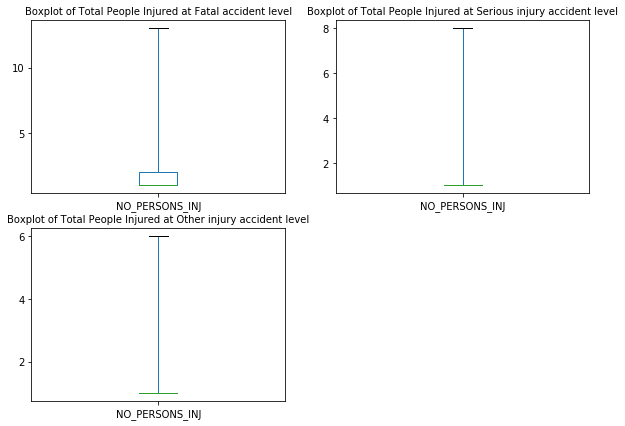

***


In [24]:
#what constitutes of a different kinds of severity (i.e. what generally makes them more severe) ? 
SEVERITY_MAP = {1 :"Fatal accident", 2 :"Serious injury accident", 3 :"Other injury accident"}




print("***")

TOTAL_ACCIDENT = []
sorted_severity = sorted(new_df["SEVERITY"].unique())

print("Recorded severity levels from this sample: ", sorted_severity)
print("severity : # of records ")
plt.figure(figsize = (10,7))


for i in  sorted_severity: 
    #for each severity, records its total no. of accidents
    TOTAL_ACCIDENT.append(new_df.loc[(new_df.SEVERITY == i)].shape[0])
    print("{} : {}".format( SEVERITY_MAP[i],TOTAL_ACCIDENT[(i-1)] ) )
    
    #draw boxplot to show distribution of NO_PERSONS_INJ for each severity
    plt.subplot(2,2,i)
    plt.title("Boxplot of Total People Injured at {} level".format(SEVERITY_MAP[i]), fontsize = 10)
    new_df.loc[new_df.SEVERITY == i, "NO_PERSONS_INJ"].plot(kind="box",whis="range")
    plt.xticks(fontsize = 10)
    plt.yticks(fontsize = 10)
    


plt.show()
print("***")


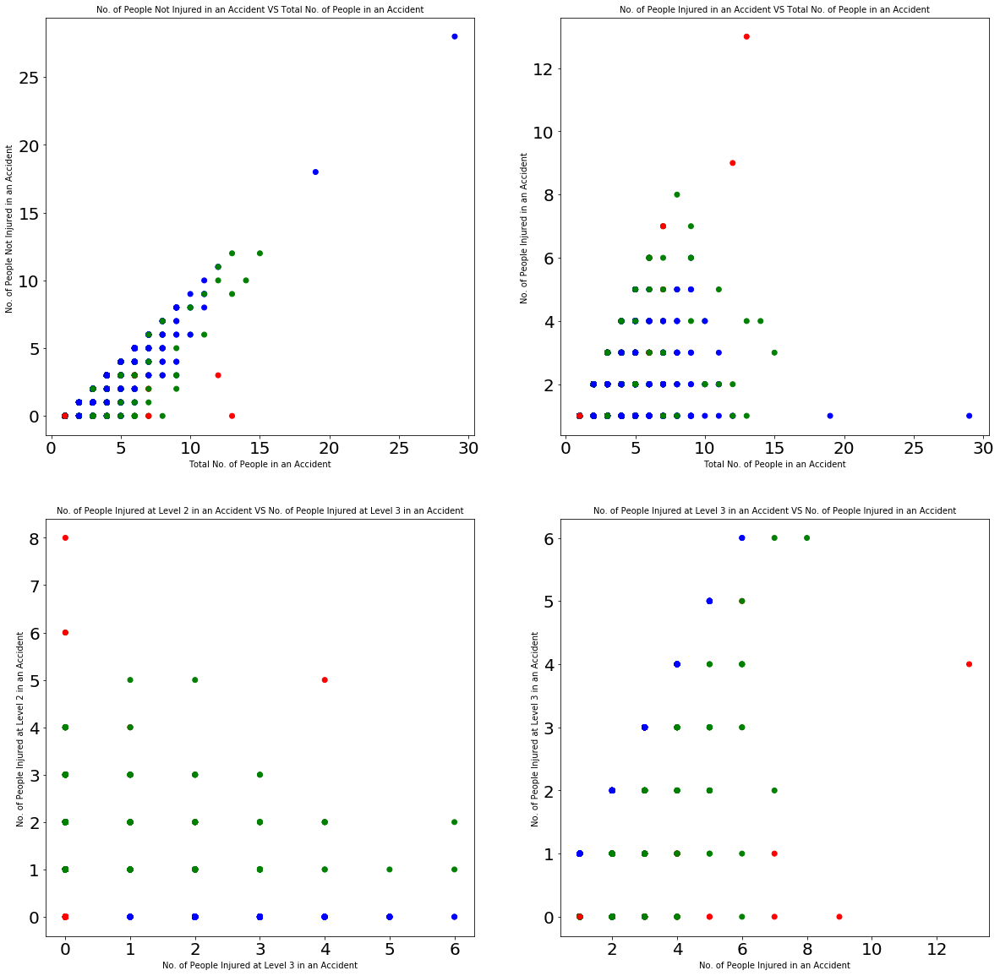

In [25]:
#deeper look at the columns building up severity 
tmp_df = new_df.loc[:,[i for i in IMPACTS if i in new_df.columns]]
labels = new_df["SEVERITY"]
rgb = labels.replace([1,2,3],['r','g','b'])
plt.figure(figsize=(20,20))

#plot People Not Injured in an Accident VS Total No. of People in an Accident
plt.subplot(2,2,1)
plt.title("No. of People Not Injured in an Accident VS Total No. of People in an Accident",size=10)
plt.xlabel("Total No. of People in an Accident", size = 10)
plt.ylabel("No. of People Not Injured in an Accident ", size = 10)
plt.scatter(tmp_df.loc[:,"NO_PERSONS"],tmp_df.loc[:,"NO_PERSONS_NOT_INJ"], color = rgb)

#plot People Injured in an Accident VS Total No. of People in an Accident
plt.subplot(2,2,2)
plt.title("No. of People Injured in an Accident VS Total No. of People in an Accident",size=10)
plt.xlabel("Total No. of People in an Accident", size = 10)
plt.ylabel("No. of People Injured in an Accident ", size = 10)
plt.scatter(tmp_df.loc[:,"NO_PERSONS"],tmp_df.loc[:,"NO_PERSONS_INJ"], color = rgb)

#plot People Injured at Level 2 in an Accident VS No. of People Injured at Level 3 in an Accident
plt.subplot(2,2,3)
plt.title("No. of People Injured at Level 2 in an Accident VS No. of People Injured at Level 3 in an Accident",size=10)
plt.xlabel("No. of People Injured at Level 3 in an Accident", size = 10)
plt.ylabel("No. of People Injured at Level 2 in an Accident ", size = 10)
plt.scatter(tmp_df.loc[:,"NO_PERSONS_INJ_3"],tmp_df.loc[:,"NO_PERSONS_INJ_2"], color = rgb)

#plot People Injured at Level 3 in an Accident VS No. of People Injured in an Accident
plt.subplot(2,2,4)
plt.title("No. of People Injured at Level 3 in an Accident VS No. of People Injured in an Accident",size=10)
plt.xlabel("No. of People Injured in an Accident", size = 10)
plt.ylabel("No. of People Injured at Level 3 in an Accident ", size = 10)
plt.scatter(tmp_df.loc[:,"NO_PERSONS_INJ"],tmp_df.loc[:,"NO_PERSONS_INJ_3"], color = rgb)
plt.show()





### Parallel coordinates
Parallel coordinates for year by year analysis on  a few continuous and discrete variables.
p.s. for severity and injury level, the lower the value is, the worse it gets. 

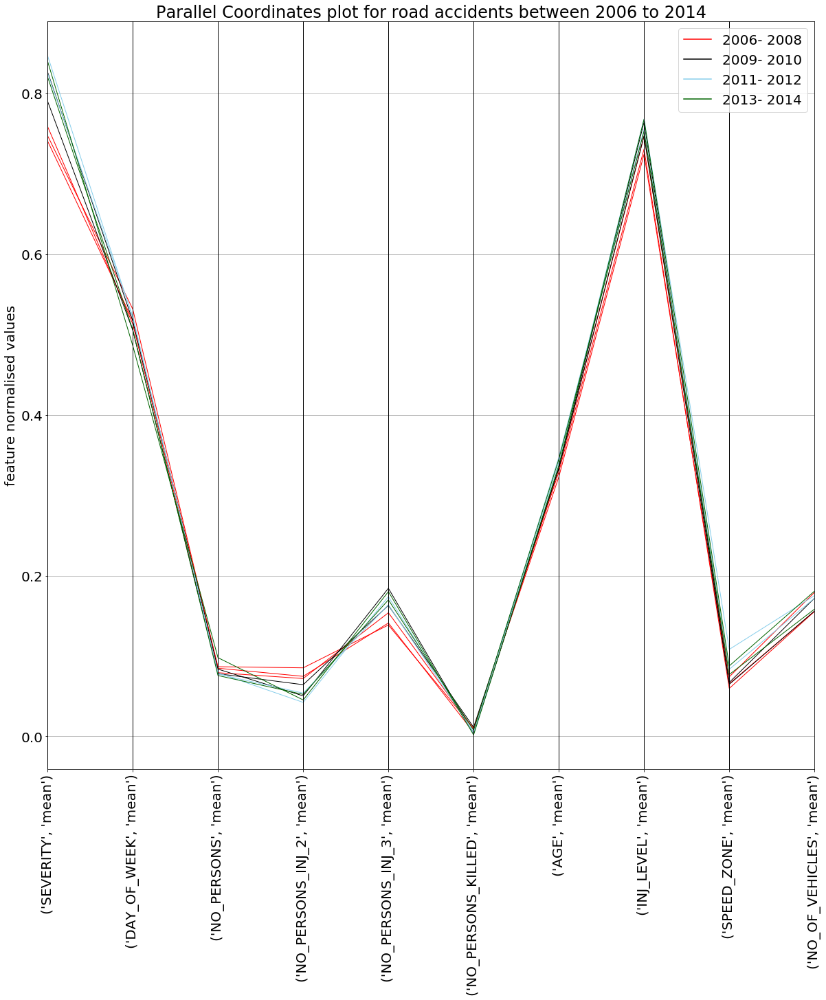

In [26]:
#display parallel coordinates for a few continuous variables of impacts 
#code adapted from model answer Phase1
FILTERS = ["SEVERITY",'DAY_OF_WEEK','NO_PERSONS', 'NO_PERSONS_INJ_2', 'NO_PERSONS_INJ_3',"NO_PERSONS_KILLED", 
                        "AGE", "INJ_LEVEL","ACCIDENTDATE","SPEED_ZONE", "NO_OF_VEHICLES"]

PARALLEL_COORDINATES = [i for i in FILTERS if (i!="ACCIDENTDATE")]
tmp_df = new_df2.loc[:,FILTERS ].dropna()
tmp_df["year"] = tmp_df["ACCIDENTDATE"].dt.year



#normalize data for each column
for i in PARALLEL_COORDINATES:
    tmp_df[i] = (tmp_df[i]-tmp_df[i].min())/(tmp_df[i].max()-tmp_df[i].min())

#group by the mean for each column
tmp_df = tmp_df.groupby("year").agg(['mean']).reset_index()

#label the years for the Legend
tmp_df.loc[(tmp_df['year'] >=2006)&(tmp_df['year'] <=2008),'selected']= '2006- 2008' 
tmp_df.loc[(tmp_df['year'] >2008)&(tmp_df['year'] <=2010),'selected']= '2009- 2010'  

tmp_df.loc[(tmp_df['year'] >2010)&(tmp_df['year'] <=2012),'selected']= '2011- 2012' 
tmp_df.loc[(tmp_df['year'] >2012)&(tmp_df['year'] <=2014),'selected']= '2013- 2014'  


#plot

fig = plt.figure(figsize=(20,20))


ax = parallel_coordinates(tmp_df[PARALLEL_COORDINATES+['selected']],'selected',color=["red","black","skyblue","darkgreen"])


plt.setp(ax.lines, linewidth=1)
plt.ylabel("feature normalised values")
plt.title('Parallel Coordinates plot for road accidents between 2006 to 2014')
plt.xticks(rotation = 90)
plt.show()


## 4. Prediction Modelling: KNN, DT Classifier
Predicting based on IMPACTS and POSSIBLE_CAUSES.

In [28]:
#make classifier
(X_train_causes, X_test_causes, y_train_causes, y_test_causes) = train_test_split(X_causes, Y, test_size = 0.2, random_state =38)
(X_train_impact, X_test_impact, y_train_impact, y_test_impact) = train_test_split(X_impact, Y, test_size = 0.2, random_state =38)


print("***")
print("X_train_cause matrix: {}".format( X_train_causes.shape))
print("y_train_cause labels: {}".format( y_train_causes.shape))
print("X_test_cause matrix: {}".format( X_test_causes.shape))
print("y_test_cause matrix:{}".format( y_test_causes.shape))
print("***")
print("X_train_impact matrix: {}".format( X_train_impact.shape))
print("y_train_impact labels: {}".format( y_train_impact.shape))
print("X_test_impact matrix: {}".format( X_test_impact.shape))
print("y_test_impact matrix:{}".format( y_test_impact.shape))
print("***")



***
X_train_cause matrix: (13484, 14)
y_train_cause labels: (13484,)
X_test_cause matrix: (3371, 14)
y_test_cause matrix:(3371,)
***
X_train_impact matrix: (13484, 7)
y_train_impact labels: (13484,)
X_test_impact matrix: (3371, 7)
y_test_impact matrix:(3371,)
***


In [29]:
X_train_causes = StandardScaler().fit_transform(X_train_causes)
X_test_causes = StandardScaler().fit_transform(X_test_causes)
X_train_impact = StandardScaler().fit_transform(X_train_impact)
X_test_impact = StandardScaler().fit_transform(X_test_impact)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


### KNN Classifier 

In [30]:
#for causes factor: 
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_causes, y_train_causes)

#prints 
print("***")
print("severity of road accident by causes prediction using K-NN")
#Train accuracy
y_pred_train=knn.predict(X_train_causes)
print("Train accuracy: {0:0.2f} %".format( accuracy_score(y_train_causes, y_pred_train) * 100 ) )

#Test accuracy
y_pred_test=knn.predict(X_test_causes)
print("Test accuracy: {0:0.2f} %".format( accuracy_score(y_test_causes, y_pred_test) * 100 ) )

print("***")


#for impact
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_impact, y_train_impact)

#prints 
print("***")
print(" severity of road accident by impacts prediction using K-NN")
#Train accuracy
y_pred_train=knn.predict(X_train_impact)
print("Train accuracy: {0:0.2f} %".format( accuracy_score(y_train_impact, y_pred_train) * 100 ) )

#Test accuracy
y_pred_test=knn.predict(X_test_impact)
print("Test accuracy: {0:0.2f} %".format( accuracy_score(y_test_impact, y_pred_test) * 100 ) )

print("***")



***
severity of road accident by causes prediction using K-NN
Train accuracy: 84.37 %
Test accuracy: 63.45 %
***
***
 severity of road accident by impacts prediction using K-NN
Train accuracy: 100.00 %
Test accuracy: 100.00 %
***


the highest KNN test accuracy that can be obtained: 71.70%, and its first occurence is at n_neighbor: 1.
the average test accuracy is : 63.57%


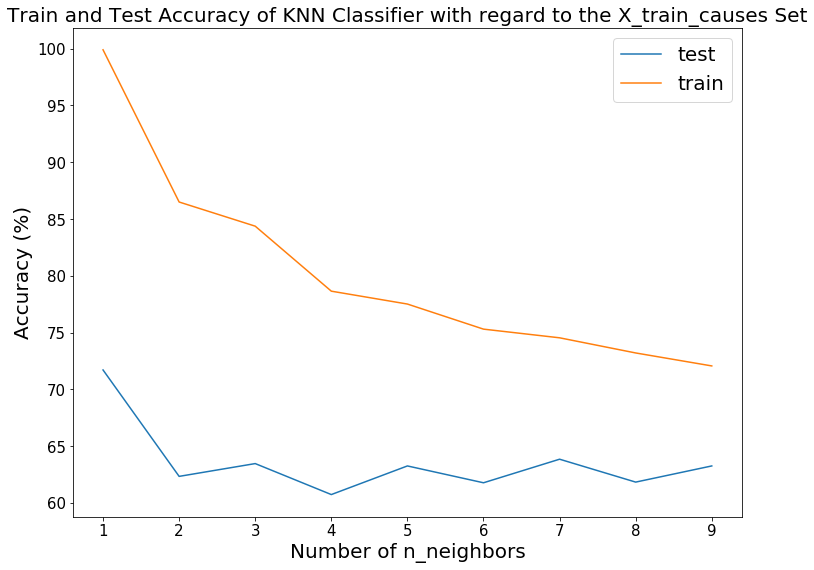

In [32]:
#finds the overall accuracy for X_train_causes
ks = range(1,10)
accu_list=[]
train_list = []

#make test and train accuracy for neighbours: 1 to 100 
for k in ks:
    #make KNN Classifier
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_causes, y_train_causes) 
    
    #predicts both test and train accuracy based on this k neighbours. 
    y_pred=knn.predict(X_test_causes)
    y_train_pred = knn.predict(X_train_causes)
    accu_list.append(accuracy_score(y_test_causes, y_pred) * 100 )
    train_list.append(accuracy_score(y_train_causes, y_train_pred) * 100 )



#plot the accuracy of KNN classifier (according to this particular X_train Set)
fig, ax = plt.subplots(figsize = (12,9))
ax.plot(ks, accu_list, label = "test")
ax.plot(ks, train_list, label = "train")

plt.title("Train and Test Accuracy of KNN Classifier with regard to the X_train_causes Set", fontsize = 20)
plt.xlabel("Number of n_neighbors", fontsize = 20)
plt.ylabel("Accuracy (%)", fontsize = 20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)
ax.legend()

#<to help justificiation>: 
accu_series = pd.Series(accu_list, index = ks) 
knn_idx = accu_series.idxmax()
knn_val = accu_series.max()
print("the highest KNN test accuracy that can be obtained: {0:0.2f}%,".format(knn_val), end = " ")
print("and its first occurence is at n_neighbor: {}.".format(knn_idx))

print("the average test accuracy is : {0:0.2f}%".format(accu_series.mean() ))




the highest KNN test accuracy that can be obtained: 100.00%, and its first occurence is at n_neighbor: 1.
the average test accuracy is : 100.00%


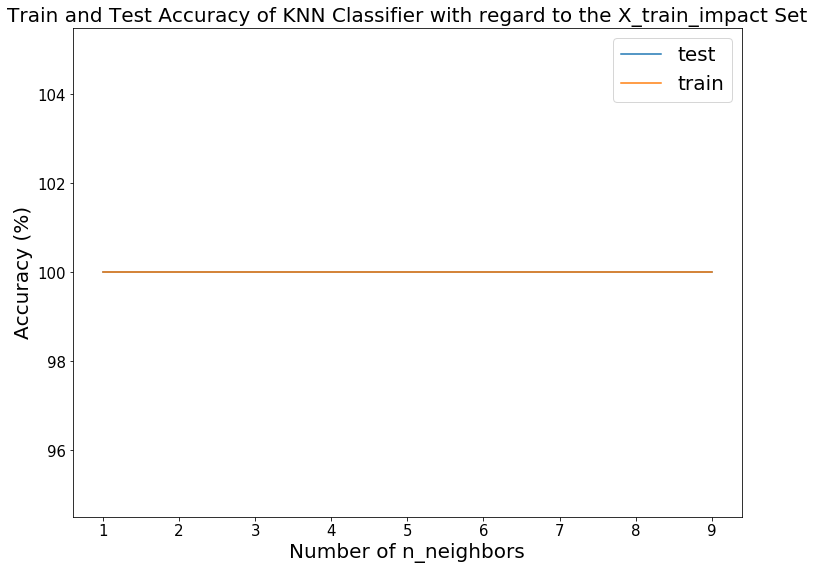

In [33]:
#finds the overall accuracy for X_train_impact 
ks = range(1,10)
accu_list=[]
train_list = []

#make test and train accuracy for neighbours: 1 to 100 
for k in ks:
    #make KNN Classifier
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_impact, y_train_impact) 
    
    #predicts both test and train accuracy based on this k neighbours. 
    y_pred=knn.predict(X_test_impact)
    y_train_pred = knn.predict(X_train_impact)
    accu_list.append(accuracy_score(y_test_impact, y_pred) * 100 )
    train_list.append(accuracy_score(y_train_impact, y_train_pred) * 100 )



#plot the accuracy of KNN classifier (according to this particular X_train Set)
fig, ax = plt.subplots(figsize = (12,9))
ax.plot(ks, accu_list, label = "test")
ax.plot(ks, train_list, label = "train")

plt.title("Train and Test Accuracy of KNN Classifier with regard to the X_train_impact Set", fontsize = 20)
plt.xlabel("Number of n_neighbors", fontsize = 20)
plt.ylabel("Accuracy (%)", fontsize = 20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)
ax.legend()

#<to help justificiation>: 
accu_series = pd.Series(accu_list, index = ks) 
knn_idx = accu_series.idxmax()
knn_val = accu_series.max()
print("the highest KNN test accuracy that can be obtained: {0:0.2f}%,".format(knn_val), end = " ")
print("and its first occurence is at n_neighbor: {}.".format(knn_idx))

print("the average test accuracy is : {0:0.2f}%".format(accu_series.mean() ))





###  DT Classifier

In [34]:


dt = DecisionTreeClassifier()
dt.fit(X_train_causes, y_train_causes)
#prints 
print("***")
print("severity of road accident by causes prediction using DT")
#Train accuracy
y_pred_train=dt.predict(X_train_causes)
print("Train accuracy: {0:0.2f} %".format( accuracy_score(y_train_causes, y_pred_train) * 100 ) )

#Test accuracy
y_pred_test=dt.predict(X_test_causes)
print("Test accuracy: {0:0.2f} %".format( accuracy_score(y_test_causes, y_pred_test) * 100 ) )

print("***")


#for impact
dt = DecisionTreeClassifier()
dt.fit(X_train_impact, y_train_impact)

#prints 
print("***")
print(" severity of road accident by impacts prediction using DT")
#Train accuracy
y_pred_train=dt.predict(X_train_impact)
print("Train accuracy: {0:0.2f} %".format( accuracy_score(y_train_impact, y_pred_train) * 100 ) )

#Test accuracy
y_pred_test=dt.predict(X_test_impact)
print("Test accuracy: {0:0.2f} %".format( accuracy_score(y_test_impact, y_pred_test) * 100 ) )

print("***")

***
severity of road accident by causes prediction using DT
Train accuracy: 99.93 %
Test accuracy: 80.90 %
***
***
 severity of road accident by impacts prediction using DT
Train accuracy: 100.00 %
Test accuracy: 100.00 %
***


the highest Decision Tree test accuracy that can be obtained: 81.87481459507563%, and its first occurence is at simulation no: 14.
the average test accuracy is : 81.38%


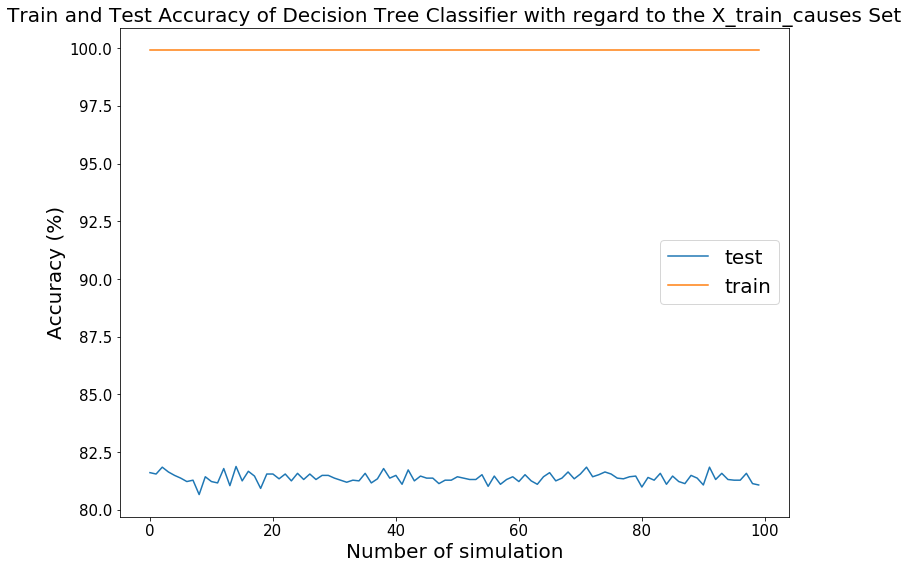

In [35]:
#calculates Train and Test accuracy for Decision Tree Classifier as much as 100 times. 
splits = range(0,100)
accu_list=[]
train_list = []
for split in splits:
    #make DT classifier 
    scaler = StandardScaler().fit(X_train_causes)
    X_test=scaler.transform(X_test_causes)
    dt.fit(X_train_causes, y_train_causes)
    
    
    y_pred=dt.predict(X_test_causes)
    y_train_pred = dt.predict(X_train_causes)
    accu_list.append(accuracy_score(y_test_causes, y_pred) *100)
    train_list.append(accuracy_score(y_train_causes, y_train_pred) *100)
#Plot
accu_df = pd.DataFrame(accu_list, index = splits, columns = ["test"])
dt_idx = accu_df["test"].idxmax()
dt_val = accu_df["test"].max() 
fig, ax = plt.subplots(figsize = (12,9))
ax.plot(splits, accu_list, label = "test")
ax.plot(splits, train_list, label = "train")
ax.legend()



plt.title("Train and Test Accuracy of Decision Tree Classifier with regard to the X_train_causes Set", fontsize = 20)
plt.xlabel("Number of simulation", fontsize = 20)
plt.ylabel("Accuracy (%)", fontsize = 20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)


print("the highest Decision Tree test accuracy that can be obtained: {}%,".format(dt_val), end = " ")
print("and its first occurence is at simulation no: {}.".format(dt_idx))

print("the average test accuracy is : {0:0.2f}%".format(accu_df["test"].mean() ))
max_depth = accu_df.loc[accu_df["test"] == accu_df["test"].max()].index.values




In [37]:
#view on X_train_causes DT classifier
export_graphviz(DecisionTreeClassifier(criterion="entropy",max_depth=max_depth[0]).fit(X_train_causes,y_train_causes),\
            out_file="mytree.dot",feature_names=POSSIBLE_CAUSES,filled=True,rounded=True)
with open("./mytree.dot") as f:
    dot_graph = f.read()

plt.figure(figsize=(9,5))
graphviz.Source(dot_graph)

<Figure size 648x360 with 0 Axes>

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.387715 to fit


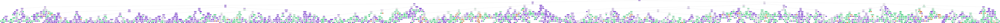

In [38]:
#overall structure of X_train_causes DT classifier
from IPython.display import Image
! dot -Tpng "mytree.dot" -o tree_d10.png #use the 'dot' command to convert the .dot file to an image
Image(filename='tree_d10.png')  # display the image.

the highest Decision Tree test accuracy that can be obtained: 100.0%, and its first occurence is at simulation no: 0.
the average test accuracy is : 100.00%


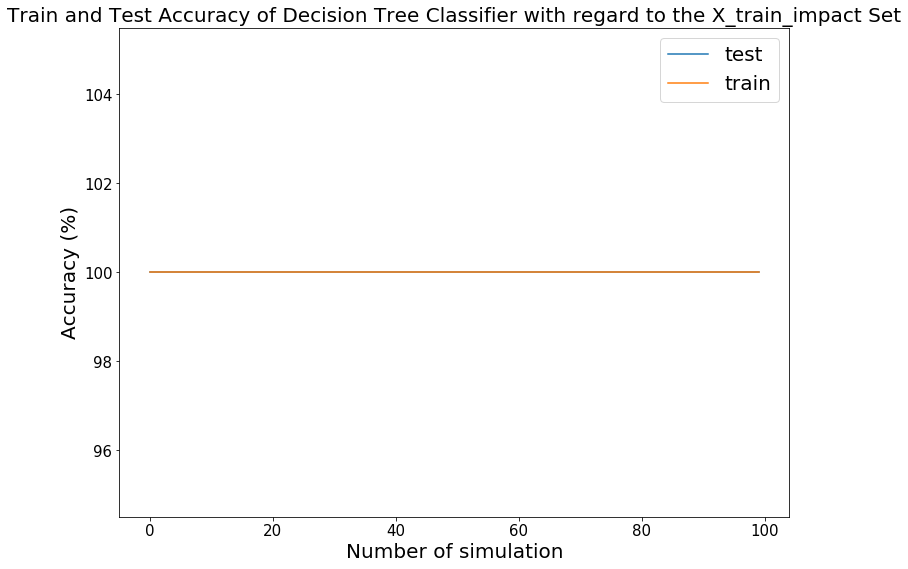

In [39]:
#calculates Train and Test accuracy for X_train_impact Decision Tree Classifier as much as 100 times. 
splits = range(0,100)
accu_list=[]
train_list = []
for split in splits:
    #make DT classifier 
    scaler = StandardScaler().fit(X_train_impact)
    X_test=scaler.transform(X_test_impact)
    dt.fit(X_train_impact, y_train_impact)
    
    #prediction for  test and score accuracy
    y_pred=dt.predict(X_test_impact)
    y_train_pred = dt.predict(X_train_impact)
    accu_list.append(accuracy_score(y_test_impact, y_pred) *100)
    train_list.append(accuracy_score(y_train_impact, y_train_pred) *100)
#Plot
accu_df = pd.DataFrame(accu_list, index = splits, columns = ["test"])
dt_idx = accu_df["test"].idxmax()
dt_val = accu_df["test"].max() 
fig, ax = plt.subplots(figsize = (12,9))
ax.plot(splits, accu_list, label = "test")
ax.plot(splits, train_list, label = "train")
ax.legend()



plt.title("Train and Test Accuracy of Decision Tree Classifier with regard to the X_train_impact Set", fontsize = 20)
plt.xlabel("Number of simulation", fontsize = 20)
plt.ylabel("Accuracy (%)", fontsize = 20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)


print("the highest Decision Tree test accuracy that can be obtained: {}%,".format(dt_val), end = " ")
print("and its first occurence is at simulation no: {}.".format(dt_idx))

print("the average test accuracy is : {0:0.2f}%".format(accu_df["test"].mean() ))
max_depth = accu_df.loc[accu_df["test"] == accu_df["test"].max()].index.values





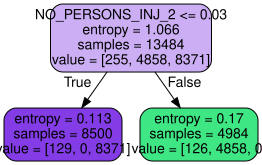

<Figure size 648x360 with 0 Axes>

In [40]:
#overall structure of X_train_causes DT classifier


export_graphviz(DecisionTreeClassifier(criterion="entropy",max_depth=max_depth[1]).fit(X_train_impact,y_train_impact),\
            out_file="mytree.dot",feature_names=IMPACTS,filled=True,rounded=True)
with open("./mytree.dot") as f:
    dot_graph = f.read()

plt.figure(figsize=(9,5))
graphviz.Source(dot_graph)

## Conclusions: (99 words)